<h1>Data presentation script

<h2>Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

<h3>Fundamental functions

<h3>Data preparation for making map functions

In [2]:
pd.set_option("mode.chained_assignment", None)

In [3]:
#def createLabels(citobands, dens):
#    labels = citobands.values
#    for i in range(len(dens.values)):
#        if dens[i] <= 0.1:
#            labels[i] = " "
#    return labels

def createLabels_restricted(citobands):
    """Create labels restricted by the respective value
    """
    labels = citobands.values
    labels[-1] = ""
    centromere = []
    found = False   
    for i in range(0, len(labels)-1):
        if labels[i][0] == "p" and labels[i+1][0] == "q":
            centromere.append(i)
            centromere.append(i+1)
            found = True
    if found == True:
        for i in range(0, len(labels)-1):
            if i not in centromere:
                labels[i] = ""
    return labels

In [4]:
def plotAll(cb_df, density):
    #figure, axis = plt.subplots(8, 3, figsize=(60,80))
    figure, axis = plt.subplots(4, 6, figsize=(120,40))
    chromossomes = cb_df["Chromossome"].unique()
    chromossomes = list(map(str, chromossomes))
    if "chrM" in chromossomes:
        chromossomes.remove("chrM")
    chr_n = 0
    for i in range(4):
        for j in range(6):
            chr_df = cb_df.loc[cb_df["Chromossome"] == chromossomes[chr_n]]
            #print(chr_df)
            axis[i, j].plot(chr_df["Citoband"], chr_df[density], 'ro--', linewidth=1, markersize=4)
            axis[i, j].set_yscale('log')
            plt.grid()
            axis[i, j].set_title(density +  "in chromossome: " + chromossomes[chr_n], fontweight="bold", size=32)
            #axis[i, j].tick_params(axis='x', color='m', length=4, direction='in', width=4,
            #           labelcolor='g', grid_color='b')
            #labels = createLabels(chr_df["Citoband"], chr_df[density])
            labels = createLabels_restricted(chr_df["Citoband"])
            axis[i,j].set_xticks(np.arange(len(chr_df["Citoband"])), labels, rotation=35, fontsize = 24)
            axis[i,j].tick_params(axis='both', which='major', labelsize=22)
            axis[i,j].tick_params(axis='both', which='minor', labelsize=22)
            chr_n += 1
            
            #axis.invert_yaxis()
    #figure.autofmt_xdate()
    
    plt.savefig("Densities_graphics/" + density + "AllCHR_horizontal.pdf", format="pdf", bbox_inches="tight")
    #plt.savefig("images/" + density + "Chromosomes_horizontal.png", format="png", bbox_inches="tight", dpi=300)
    #plt.show()

In [5]:
def plot_1chr(cb_df, chromossome, dens_type):
    """
    chromossome = "chrn" n is 1 to Y
    """
    chr_df = cb_df.loc[cb_df["Chromossome"] ==  str(chromossome)]
    fig, ax = plt.subplots(figsize=(12, 8))#, layout='constrained')
    ax.plot(chr_df["Citoband"], chr_df[dens_type], 'ro--', linewidth=2, markersize=6, label = dens_type)
    ax.axvline(x=7, color = "black")
    ax.axvline(x=8, color = "black")
    ax.set_yscale('log')
    ax.set_xlabel("Cytoband")
    ax.set_ylabel(dens_type)
    ax.grid()
    ax.legend()
    ax.label_outer()
    ax.set_title(dens_type + ' in chromosome ' + chromossome, fontweight="bold", size=22)
    fig.autofmt_xdate()
    fig.savefig("Densities_graphics/" + chromossome + dens_type + ".pdf", format="pdf", bbox_inches="tight")
    #fig.savefig("images/" + chromossome + "STR_density.png", format="png", bbox_inches="tight")

In [6]:
def makeMap_dens(cb_df, density):        #dens_types: "STR_Density" "DR_density"
    """Make a map of the densities
    """
    chromossomes = cb_df["Chromossome"].unique()
    chromossomes = list(map(str, chromossomes))
    if "chrM" in chromossomes:
        chromossomes.remove("chrM")
    mapping = []
    for chromosome in chromossomes:
        chr_subset = cb_df.loc[cb_df["Chromossome"] == chromosome]
        ### Cada linha do mapa é um cromossoma e tem 34 ps e 38 qs, formando um total de 72 espaços para as cytobands
        ps = np.zeros(34, dtype=(float, 1))
        qs = np.zeros(38, dtype=(float, 1))
        for n in range(len(ps)):
            ps[n] = np.nan
        for n in range(len(qs)):
            qs[n] = np.nan
        pcount = -1
        qcount = 0
        p_list = []
        q_list = []
        for row in chr_subset.index:
            cytoband = chr_subset["Citoband"][row]
            dens = chr_subset[density][row]
            if cytoband[0] == "p":
                p_list.append(dens)
            elif cytoband[0] == "q":
                q_list.append(dens)
        p_list.reverse()
        for p in p_list:
            ps[pcount] = p
            pcount -= 1
        for q in q_list:
            qs[qcount] = q
            qcount += 1
        ps_list = ps.tolist()
        qs_list = qs.tolist()
        pqs = ps_list + qs_list
        mapping.append(pqs)
    return mapping

def makeMap_dict(cb_df, density):
    chromossomes = cb_df["Chromossome"].unique()
    chromossomes = list(map(str, chromossomes))
    if "chrM" in chromossomes:
        chromossomes.remove("chrM")
    cytobands = cb_df["Citoband"].unique()
    cytobands = list(map(str, cytobands))
    mapping = {}
    for chromosome in chromossomes:
        chr_subset = cb_df.loc[cb_df["Chromossome"] == chromosome]
        ps = np.zeros(34, dtype=(list, 2))
        qs = np.zeros(38, dtype=(list, 2))
        pcount = -1
        qcount = 0
        p_list = []
        q_list = []
        for row in chr_subset.index:
            cytoband = chr_subset["Citoband"][row]
            dens = chr_subset[density][row]
            if cytoband[0] == "p":
                p_list.append([cytoband, dens])
            elif cytoband[0] == "q":
                q_list.append([cytoband, dens])
        p_list.reverse()
        for p in p_list:
            ps[pcount] = p
            pcount -= 1
        for q in q_list:
            qs[qcount] = q
            qcount += 1
        ps_list = ps.tolist()
        qs_list = qs.tolist()
        pqs = ps_list + qs_list
        for n in range(len(pqs)):
            if pqs[n] == [0, 0]:
                pqs[n] = np.nan
        mapping.update({chromosome : pqs})
    return mapping

<h3>Create a colormap

In [7]:
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : 14}

plt.rc('font', **font)

In [8]:
green = np.array([1/10, 9/10, 1/10, 0.7])

lYelw = np.array([10/10, 10/10, 7/10, 1])
yelw = np.array([10/10, 10/10, 4/10, 1])
dYelw = np.array([10/10, 9/10, 0/10, 0.7])

lOrng = np.array([10/10, 7/10, 1/10, 0.9])
orng = np.array([10/10, 5/10, 1/10, 0.9])
dOrng = np.array([10/10, 3/10, 1/10, 0.9])

lred = np.array([10/10, 1/10, 1/10, 0.9])
Red = np.array([7/10, 1/10, 1/10, 0.95])
dRed = np.array([4/10, 1/10, 1/10, 1])

white = np.array([0/10, 0/10, 0/10, 0])

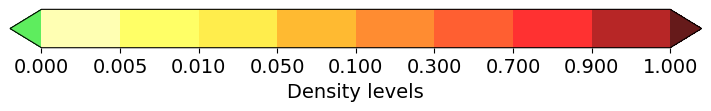

In [9]:
fig, ax = plt.subplots(figsize=(7, 1), layout='constrained')

colormap = plt.cm.YlOrRd
newColorMap = colormap(np.linspace(0, 1, 512))
newColorMap[0, :] = green
#newcmp = ListedColormap(newColorMap)

colormap = (mpl.colors.ListedColormap([green, lYelw, yelw, dYelw, lOrng, orng, dOrng, lred, Red, dRed]))
        #.with_extremes(under='yellow', over='magenta'))


bounds = [0, 0.005, 0.010, 0.05, 0.1, 0.3, 0.7, 0.9, 1]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')
#norm = mpl.colors.LogNorm()#bounds[0], bounds[len(bounds)-1])
mappable = mpl.cm.ScalarMappable(cmap=colormap, norm=norm)

cmap = mappable.get_cmap()

fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap),
             cax=ax, orientation='horizontal', label='Density levels')

map_legend = plt.gcf()

plt.savefig('images/mapLegend.pdf', format="pdf", bbox_inches="tight")

In [10]:
def cColours(data):
    coloursMap = []
    for row in data:
        colours = []
        for col in row:
            density = col[0]
            if density == 0.0:
                colours.append(green)
            elif 0.0 < density < 0.005:
                colours.append(lYelw)
            elif 0.005 <= density < 0.015:
                colours.append(yelw)
            elif 0.015 <= density < 0.030:
                colours.append(dYelw)
            elif 0.030 <= density < 0.050:
                colours.append(lOrng)
            elif 0.050 <= density < 0.100:
                colours.append(orng)
            elif 0.100 <= density < 0.500:
                colours.append(dOrng)
            elif 0.500 <= density < 0.900:
                colours.append(lred)
            elif 0.900 <= density < 1:
                colours.append(Red)
            elif density == 1:
                colours.append(dRed)
            else:
                colours.append(white)
        coloursMap.append(colours)

    return coloursMap
    

In [11]:
def cColours2(data):
    coloursMap = []
    for row in data:
        colours = []
        for col in row:
            density = col[0]
            if density == 0.0:
                colours.append(green)
            elif 0.0 < density < 0.01:
                colours.append(lYelw)
            elif 0.01 <= density < 0.05:
                colours.append(yelw)
            elif 0.05 <= density < 0.10:
                colours.append(dYelw)
            elif 0.10 <= density < 0.20:
                colours.append(lOrng)
            elif 0.20 <= density < 0.40:
                colours.append(orng)
            elif 0.40 <= density < 0.60:
                colours.append(dOrng)
            elif 0.500 <= density < 0.900:
                colours.append(lred)
            elif 0.900 <= density < 1:
                colours.append(Red)
            elif density == 1:
                colours.append(dRed)
            else:
                colours.append(white)
        coloursMap.append(colours)

    return coloursMap

<h3>Function to make map

In [12]:
def plotMap(data, dict, img_name="density_map.pdf"):
    #rows = ('chr1', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr2', 'chr20', 'chr21', 'chr22', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chrX', 'chrY')
    rows = ('chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22', 'chrX', 'chrY')
    cols = ["p34", "p33", "p32", "p31", "p30", "p29", "p28", "p27", "p26", "p25", "p24", "p23", "p22", "p21", "p20", "p19", "p18", "p17", "p16", "p15", "p14", "p13", "p12", "p11", "p10", "p09", "p08", "p07", "p06", "p05", "p04", "p03", "p02", "p01-centromer", "q01-centromer", "q02", "q03", "q04", "q05", "q06", "q07", "q08", "q09", "q10", "q11", "q12", "q13", "q14", "q15", "q16", "q17", "q18", "q19", "q20", "q21", "q22", "q23", "q24", "q25", "q26", "q27", "q28", "q29", "q30", "q31", "q32", "q33", "q34", "q35", "q36", "q37", "q38"]
    n_rows = len(data)
    n_cols = len(data[0])

    # Plot bars and create text labels for the table
    cell_text = []
    for row in rows:
        cell_text.append(dict[row])

    #Get some lists of color specs for row and column headers
    rcolors = plt.cm.BuPu(np.full(len(rows), 0.1))
    ccolors = plt.cm.BuPu(np.full(len(cols), 0.1))
    cellcolours = cColours(data)
    
    fig = plt.figure(linewidth=2,
           #edgecolor=fig_border,
           #facecolor=fig_background_color,
           tight_layout={'pad':1},
           figsize = (58, 32),
          )
    
    partition1 = fig.add_subplot(2, 1, 1)
    the_table = plt.table(cellText=cell_text,
                      rowLabels=rows,
                      colLabels=cols,
                      rowLoc='right',
                      rowColours=rcolors,
                      colColours=ccolors,
                      cellColours=cellcolours,
                      loc='center')
    
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(6)
    the_table.scale(1, 8)

    table_cells = the_table.properties()["celld"]
    #print(table_cells.keys())
    cells = the_table.properties()["children"]
    #for cell in cells:
    #    print(cell)
    
    for i in range(len(cells[-24:])):
        the_table[i+1, -1].set_width(0.80)
        the_table[i+1, -1].set_fontsize(18)

    for j in range(72):
        if j != 33 and j != 34:
            the_table[0, j].set_fontsize(16)
        else:
            the_table[0, j].set_fontsize(7)

    #the_table.auto_set_column_width(-1)
    
    partition1.add_table(the_table)
    # Hide axes
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Hide axes border
    plt.box(on=None)
    
    partition2 = fig.add_subplot(2,1,2)
    partition2.axis('off')
    colormap = (mpl.colors.ListedColormap([green, lYelw, yelw, dYelw, lOrng, orng, dOrng, lred, Red, dRed]))
    
    bounds = [0, 0.005, 0.010, 0.05, 0.1, 0.3, 0.7, 0.9, 1]
    norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')
    
    the_colorbar= fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap), ax=partition2, orientation='horizontal', label='Density levels', shrink= 1/2)
    #shrink
    the_colorbar.ax.tick_params(labelsize=24)
    the_colorbar.set_label(label='Density levels', size=36,weight='bold')
    # Create image. plt.savefig ignores figure edge and face colors, so map them.
    plt.draw()
    #STR_dens_map = plt.gcf()
    
    #plt.savefig('images/STR_density_map.pdf', format="pdf", bbox_inches="tight")
    #plt.savefig('images/DR_density_map.png', format="png", bbox_inches="tight", dpi=300)
    plt.savefig('Densities_graphics/' + img_name, format="pdf", bbox_inches="tight")

<h3>Code for running the program

In [13]:
import warnings
warnings.filterwarnings("ignore", message=r"Passing", category=FutureWarning)

In [14]:
#citoPath_read = "/home/androx/Documents/trabalho/citobands/cytobandFiltered_ordered_str_dr.txt"
#cb_df = pd.read_csv(citoPath_read, sep="\t")

#dens_map = makeMap_dens(cb_df, "DR_density")
#dict_map= makeMap_dict(cb_df, "DR_density")

In [15]:
#plot_1chr(cb_df, "chr18", "DR_density")

In [16]:
#plotAll(cb_df, "DR_density")

In [17]:
#DR_dens = plotMap(dens_map, dict_map)

In [28]:
#citoband_read = "/home/andre/Documents/trabalho/cytobands/cytobandFiltered_processed_str_dr_dg_gv_sorted.txt"
#citoband_read = "/home/andre/Documents/trabalho/cytobands/cytobandFiltered_processed_str_dr_dg_MANESelect.txt"
cytoband_read = "/home/andre/Documents/trabalho/cytobands/cytobandFiltered_processed_str_dr_dgsMainTrcpts_ordered.txt"

cb_df = pd.read_csv(cytoband_read, sep="\t")
cb_df

,Chromossome,First_index,Last_index,Citoband,Unkown,Size,TandemRepeats_dens,STRs_dens,LTRs_dens,DRs_density,CDS_dens,CDS_exon_dens,CDS_intron_dens,5P UTR_dens,3P UTR_dens,exon_dens,intron_dens
0,chr1,0,2299999,p36.33,gneg,2299999,0.087516,0.006384,0.084476,0.326328,0.320123,0.033313,0.286810,0.003850,0.017207,0.054411,0.945589
1,chr1,2300000,5299999,p36.32,gpos25,2999999,0.084077,0.013902,0.079223,0.281556,0.319537,0.012185,0.307352,0.001189,0.011664,0.025051,0.974949
2,chr1,5300000,7099999,p36.31,gneg,1799999,0.056236,0.012909,0.051421,0.275410,0.513454,0.019712,0.493741,0.001799,0.017184,0.038717,0.961283
3,chr1,7100000,9099999,p36.23,gpos25,1999999,0.049082,0.013229,0.042217,0.404844,0.599978,0.011923,0.588055,0.000973,0.010427,0.023335,0.976665
4,chr1,9100000,12499999,p36.22,gneg,3399999,0.055881,0.011072,0.048928,0.404047,0.503717,0.028345,0.475372,0.002091,0.022889,0.051908,0.948092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857,chrY,12400000,17099999,q11.221,gpos50,4699999,0.036956,0.014211,0.029356,0.015158,0.130477,0.003649,0.126828,0.000374,0.002092,0.006119,0.993881
858,chrY,17100000,19599999,q11.222,gneg,2499999,0.061662,0.015902,0.052790,0.012965,0.002646,0.002263,0.000383,0.000335,0.000100,0.002702,0.997298
859,chrY,19600000,23799999,q11.223,gpos50,4199999,0.082234,0.005789,0.078347,0.006441,0.074550,0.004770,0.069780,0.000534,0.002394,0.007705,0.992295
860,chrY,23800000,26599999,q11.23,gneg,2799999,0.026278,0.009164,0.020721,0.001822,0.045305,0.002629,0.042676,0.000616,0.001974,0.005223,0.994777


In [15]:
cb_df.loc[cb_df["TandemRepeats_dens"] > 1, ["TandemRepeats_dens", "LTRs_dens"]] = 1.000000

In [16]:
#cb_df.loc[cb_df["LTRs_dens"] > 1]
cb_df.loc[cb_df["LTRs_dens"] >= 1]

,Chromossome,First_index,Last_index,Citoband,Unkown,Size,TandemRepeats_dens,STRs_dens,LTRs_dens,DRs_density,CDS_dens,CDS_exon_dens,CDS_intron_dens,5P UTR_dens,3P UTR_dens,exon_dens
185,chr13,16500000,17699999,p11.1,acen,1199999,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
253,chr15,17500000,18999999,p11.1,acen,1499999,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
455,chr21,10900000,11999999,p11.1,acen,1099999,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
469,chr22,13700000,14999999,p11.1,acen,1299999,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
display(cb_df.iloc[601])

Chromossome               chr5
First_index           38400000
Last_index            42499999
Citoband                 p13.1
Unkown                    gneg
Size                   4099999
TandemRepeats_dens    0.018013
STRs_dens             0.005802
LTRs_dens             0.014195
DRs_density           0.201751
CDS_dens              0.236513
CDS_exon_dens         0.009988
CDS_intron_dens       0.226525
5P UTR_dens           0.000872
3P UTR_dens            0.01164
exon_dens              0.02251
Name: 601, dtype: object

In [18]:
def make_one_Dens(cytoband_df, dens = "Exons_density", img_name = "density_map.pdf"):
    dens_map = makeMap_dens(cytoband_df, dens)
    dict_map= makeMap_dict(cytoband_df, dens)
    #print(dens_map[0][0][0])

    plot_1chr(cytoband_df, "chr20", dens)
    plotAll(cytoband_df, dens)
    plotMap(dens_map, dict_map, img_name)

## Tandem Repeats densities

In [ ]:
make_one_Dens(cb_df, "TandemRepeats_dens", "TandemRepeats_densityMap.pdf")

In [ ]:
make_one_Dens(cb_df, "STRs_dens", "STRs_only_densityMap.pdf")

In [ ]:
make_one_Dens(cb_df, "LTRs_dens", "LTRs_only_densityMap.pdf")

## Disease_genes densities

### CDS densities

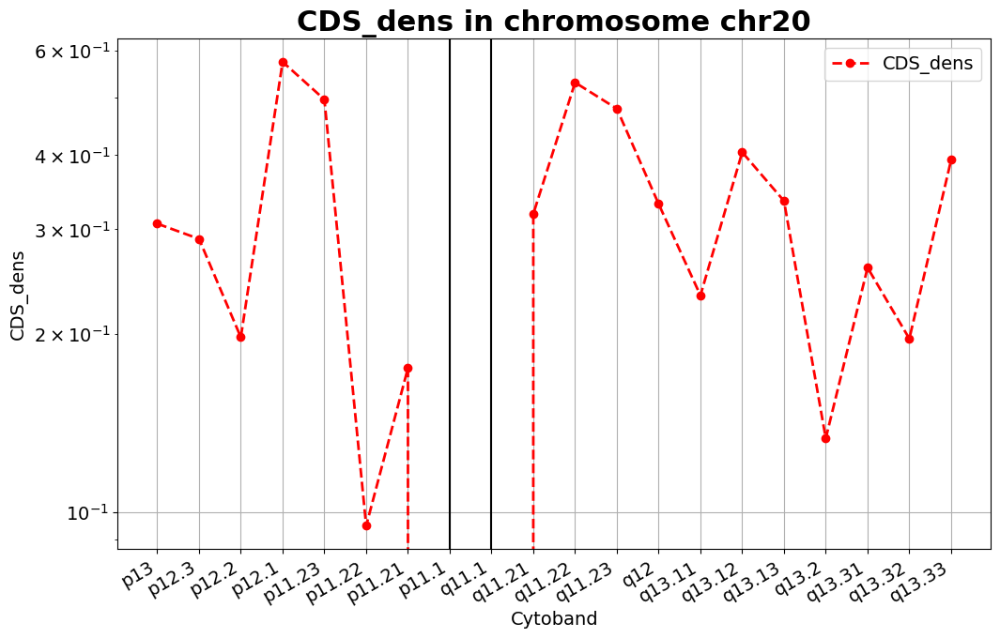

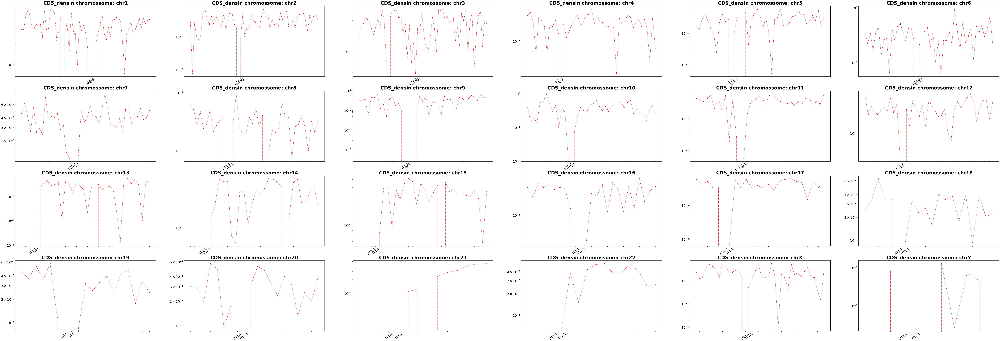

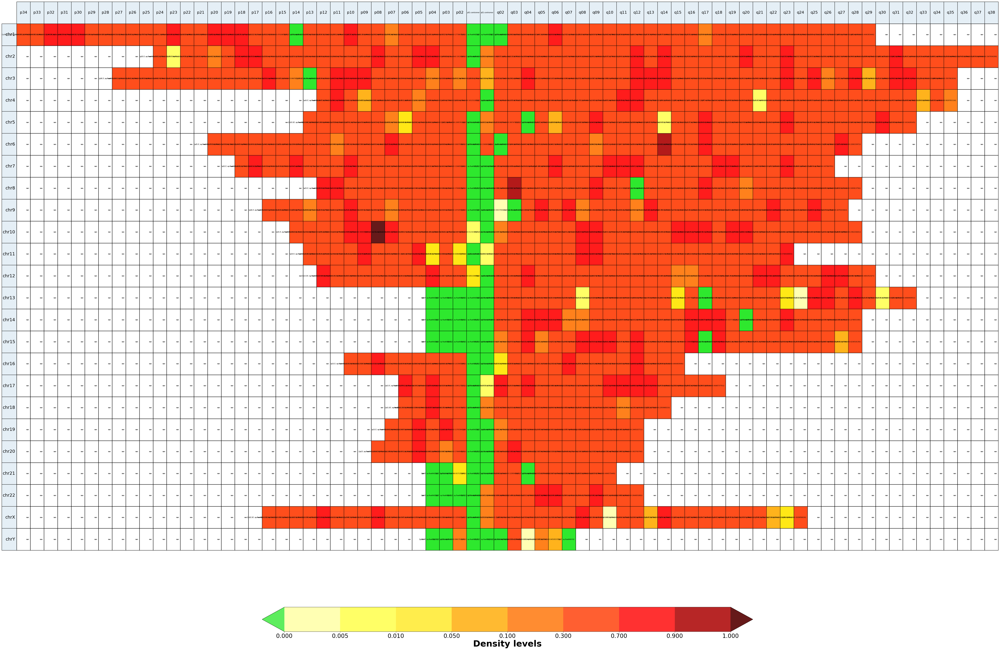

In [29]:
make_one_Dens(cb_df, "CDS_dens", "DG_CDSs_densityMap.pdf")

In [ ]:
make_one_Dens(cb_df, "CDS_exon_dens", "DG_CDSExon_densityMap.pdf")

In [ ]:
make_one_Dens(cb_df, "CDS_intron_dens", "CDSIntron_densityMap.pdf")

## 5 prime UTR densities

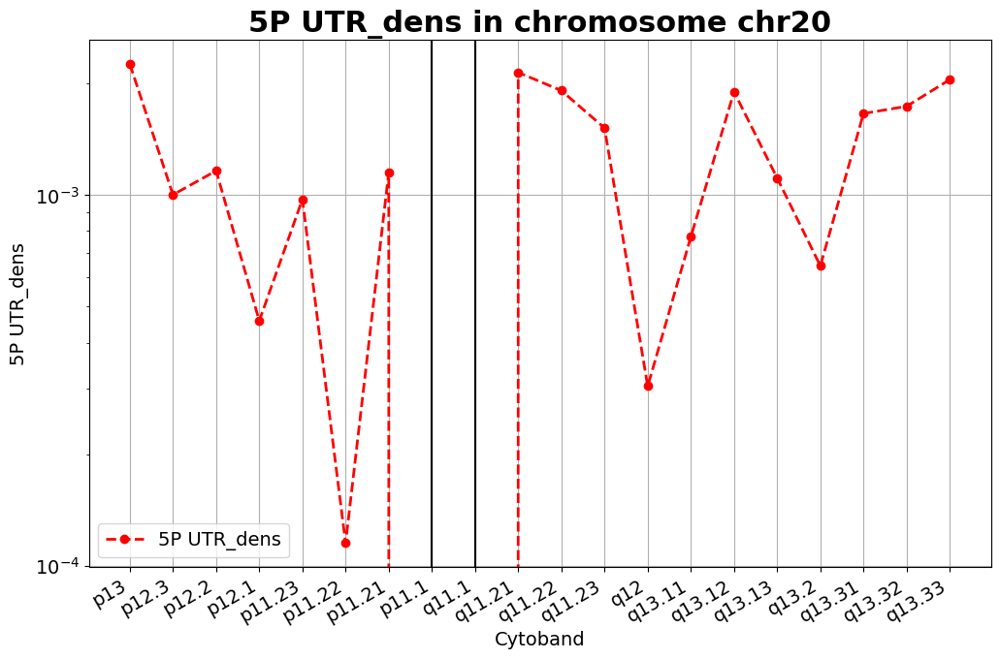

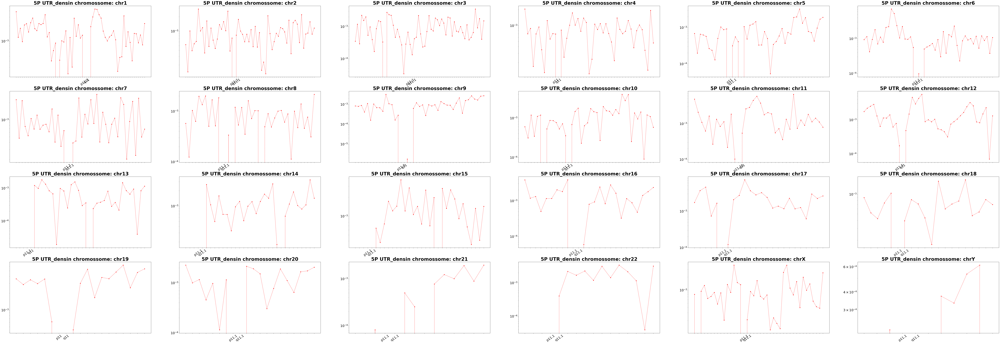

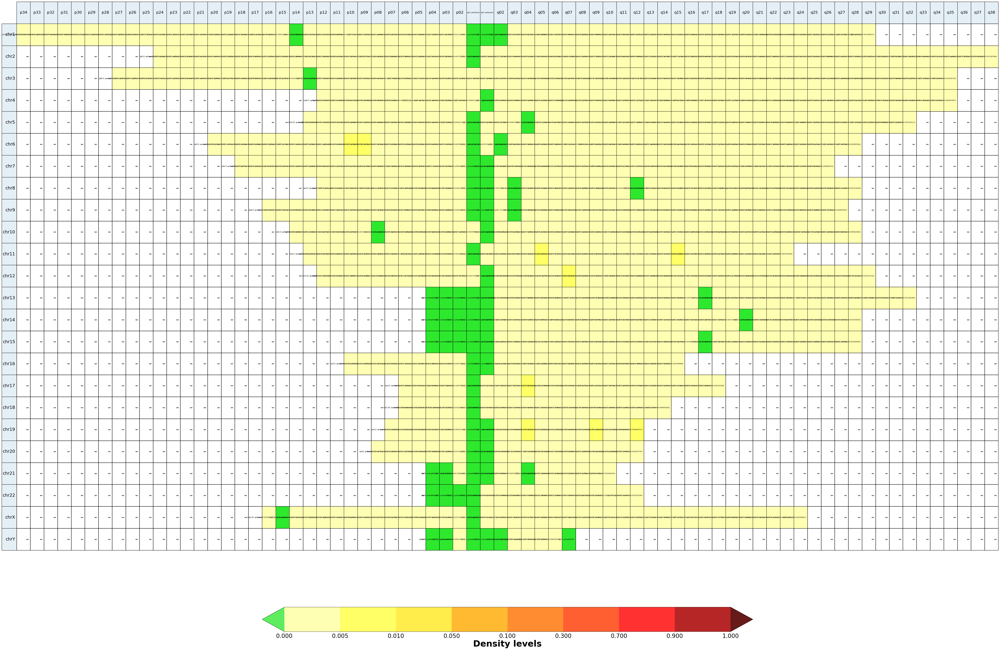

In [32]:
make_one_Dens(cb_df, "5P UTR_dens", "5P_UTR_density_map.pdf")

In [ ]:
#make_one_Dens(cb_df, "5P UTR_dens", "UTR5Intron_density_map.pdf")

In [ ]:
#make_one_Dens(cb_df, "five_prime_UTRExon_density", "UTR5Exon_density_map.pdf")

## 3 prime UTR densities

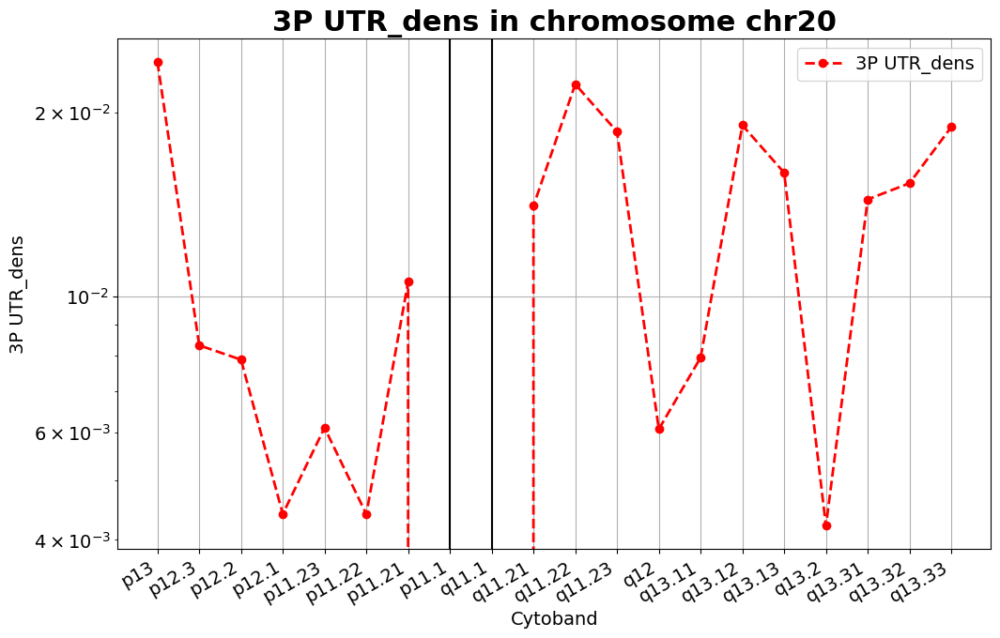

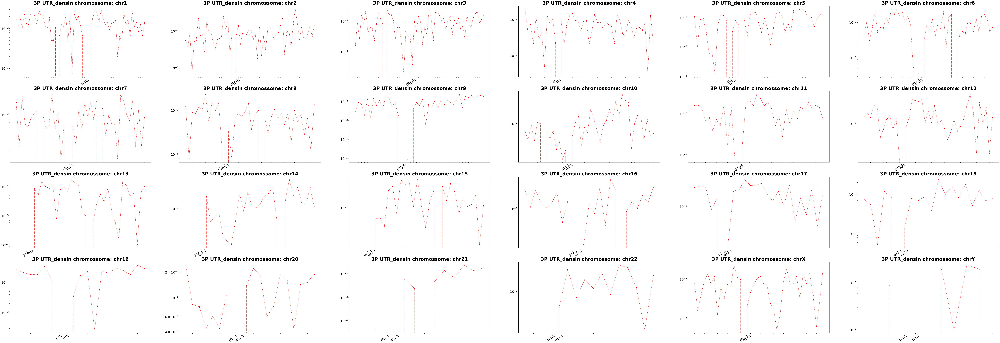

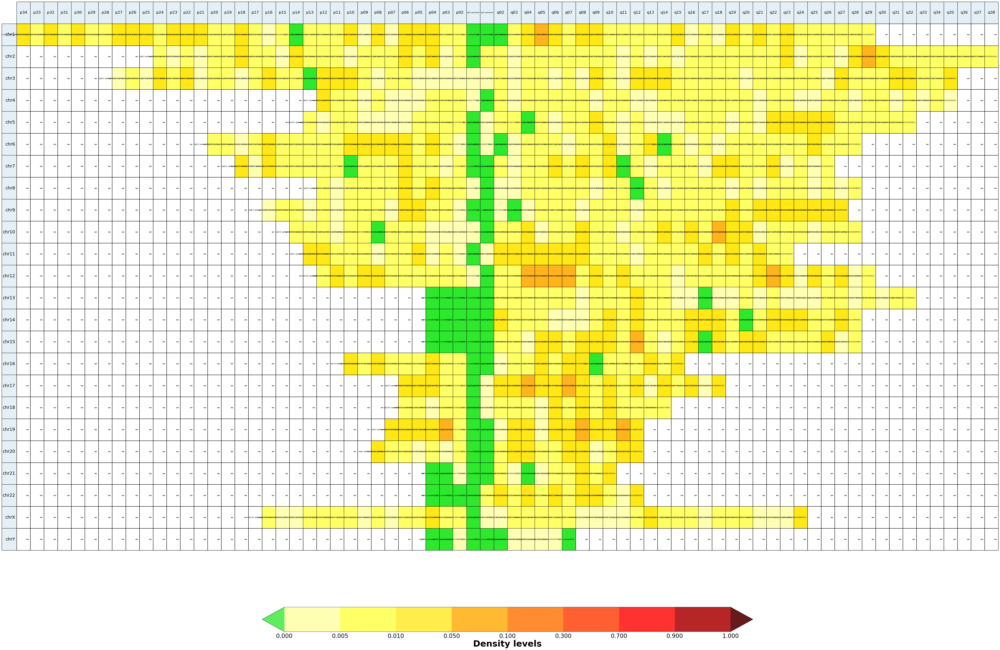

In [33]:
make_one_Dens(cb_df, "3P UTR_dens", "3P_UTR_density_map.pdf")

In [ ]:
#make_one_Dens(cb_df, "three_prime_UTRIntron_density", "UTR3Intron_density_map.pdf")

In [ ]:
#make_one_Dens(cb_df, "three_prime_UTRExon_density", "UTR3Exon_density_map.pdf")

## Total exon densities

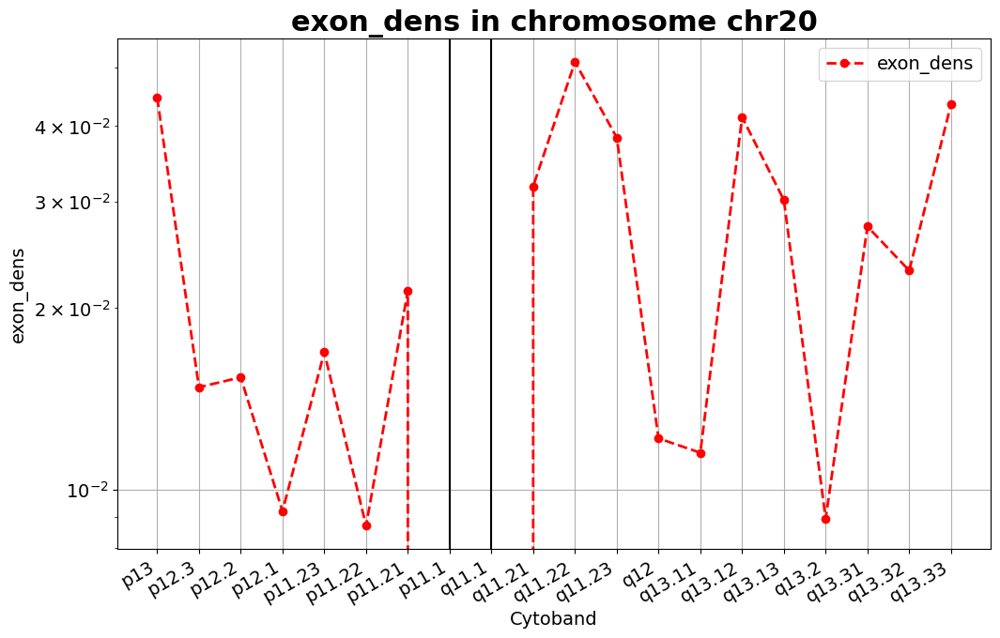

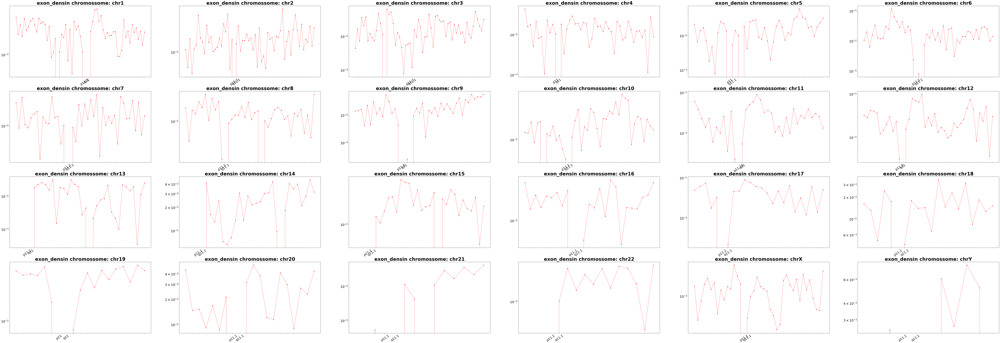

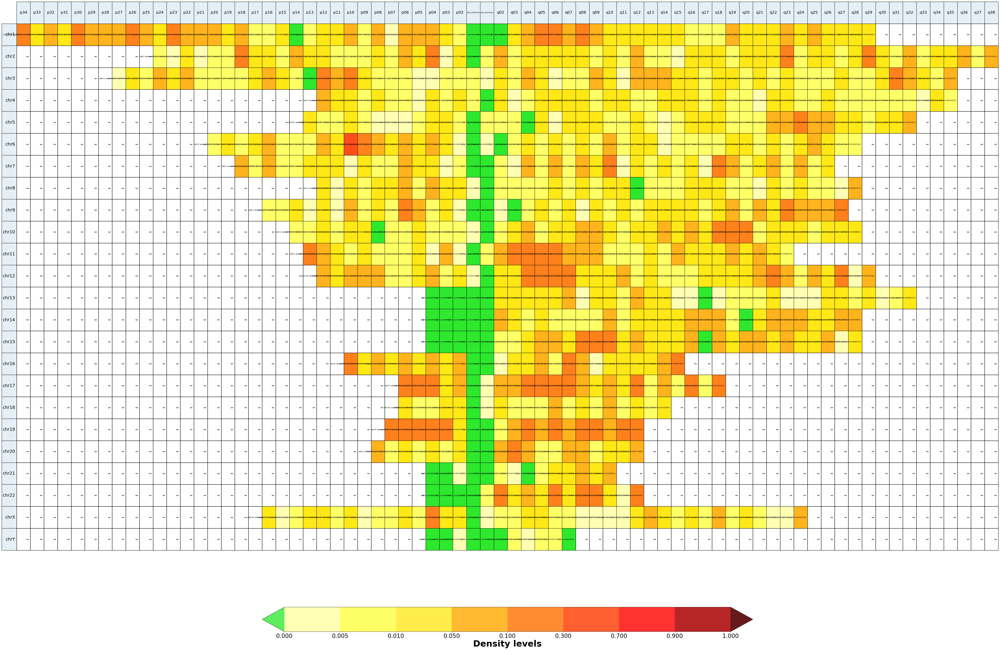

In [34]:
#make_one_Dens(cb_df, "exon_dens", "Exons_density_map.pdf")
make_one_Dens(cb_df, "exon_dens", "exon_dens.pdf")

In [ ]:
#make_one_Dens(cb_df, "Introns_density", "Introns_density_map.pdf")

## Total non-coding densities

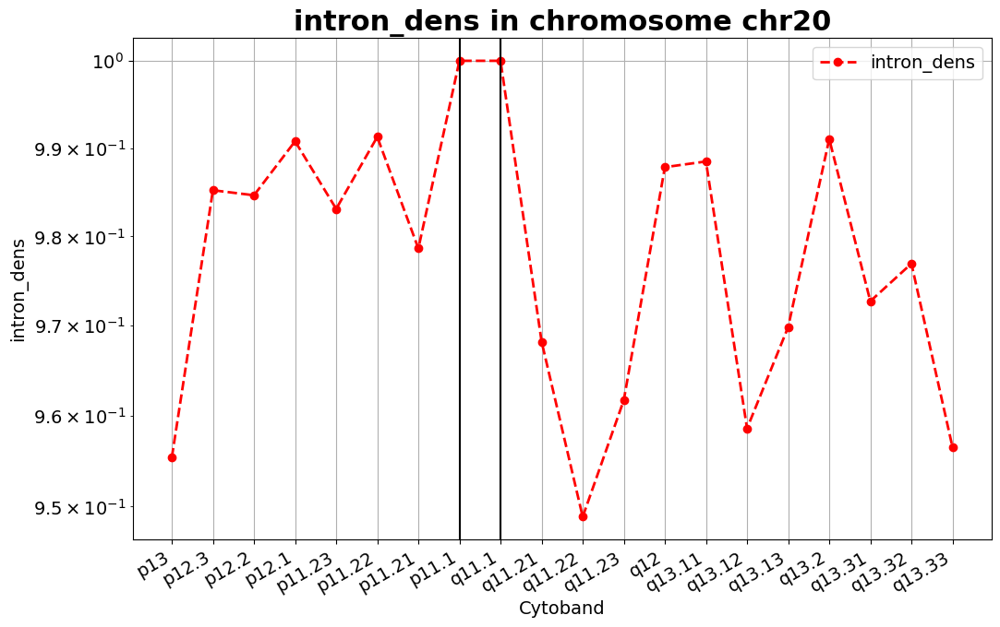

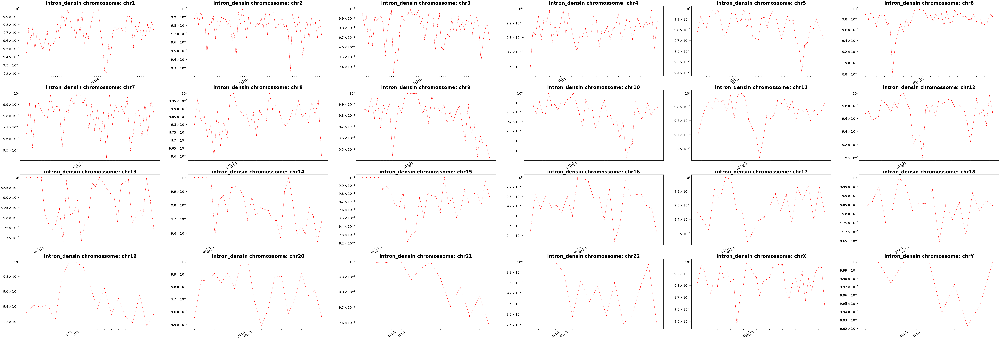

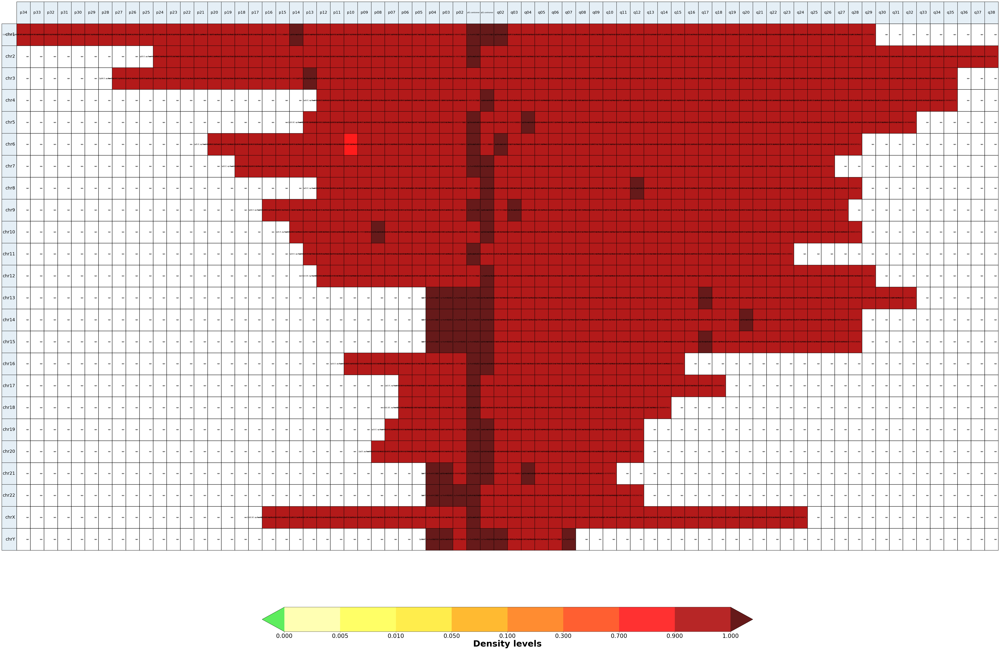

In [35]:
#make_one_Dens(cb_df, "intron_dens_accrt", "intron_dens_accrt.pdf")
make_one_Dens(cb_df, "intron_dens", "intron_dens.pdf")

## Gráficos e mapa de genomic variants (gvs)

In [ ]:
make_one_Dens(cb_df, "SNP_density", "SNP_density_map.pdf")

In [ ]:
make_one_Dens(cb_df, "Indel_density", "Indel_density_map.pdf")

In [ ]:
make_one_Dens(cb_df, "Inserts_density", "Inserts_density_map.pdf")

In [ ]:
make_one_Dens(cb_df, "Deletes_density", "Deletes_density_map.pdf")